<a href="https://colab.research.google.com/github/advcloud/colabtest/blob/main/yolorreef.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import json
import zipfile
import os

In [2]:
api_token = {"username":"aijack","key":""}

In [3]:
if not os.path.exists("/root/.kaggle"):
    os.makedirs("/root/.kaggle")
 
with open('/root/.kaggle/kaggle.json', 'w') as file:
    json.dump(api_token, file)
!chmod 600 /root/.kaggle/kaggle.json
 
if not os.path.exists("/kaggle"):
    os.makedirs("/kaggle")

In [4]:
os.chdir('/kaggle')

In [5]:
!kaggle competitions download -c tensorflow-great-barrier-reef

100% 14.2G/14.2G [01:19<00:00, 204MB/s]
100% 14.2G/14.2G [01:19<00:00, 191MB/s]


In [6]:
!ls /kaggle

tensorflow-great-barrier-reef.zip


In [7]:
!unzip /kaggle/tensorflow-great-barrier-reef.zip

串流輸出內容已截斷至最後 5000 行。
  inflating: train_images/video_2/4303.jpg  
  inflating: train_images/video_2/4304.jpg  
  inflating: train_images/video_2/4305.jpg  
  inflating: train_images/video_2/4306.jpg  
  inflating: train_images/video_2/4307.jpg  
  inflating: train_images/video_2/4308.jpg  
  inflating: train_images/video_2/4309.jpg  
  inflating: train_images/video_2/431.jpg  
  inflating: train_images/video_2/4310.jpg  
  inflating: train_images/video_2/4311.jpg  
  inflating: train_images/video_2/4312.jpg  
  inflating: train_images/video_2/4313.jpg  
  inflating: train_images/video_2/4314.jpg  
  inflating: train_images/video_2/4315.jpg  
  inflating: train_images/video_2/4316.jpg  
  inflating: train_images/video_2/4317.jpg  
  inflating: train_images/video_2/4318.jpg  
  inflating: train_images/video_2/4319.jpg  
  inflating: train_images/video_2/432.jpg  
  inflating: train_images/video_2/4320.jpg  
  inflating: train_images/video_2/4321.jpg  
  inflating: train_images/video_2/43

In [10]:
!ls /kaggle

example_sample_submission.csv  greatbarrierreef  train.csv
example_test.npy	       test.csv		 train_images


In [9]:
!rm /kaggle/tensorflow-great-barrier-reef.zip

In [11]:
import os
import cv2
import subprocess
from tqdm.auto import tqdm
import pandas as pd
from IPython.display import display, HTML
from IPython.core.display import Video
import warnings; warnings.simplefilter("ignore")


BASE_PATH = '/kaggle/train_images/'

In [12]:
df = pd.read_csv("/kaggle/train.csv")
df['annotations'] = df['annotations'].apply(eval)
df['n_annotations'] = df['annotations'].str.len()
df['has_annotations'] = df['annotations'].str.len() > 0
df['has_2_or_more_annotations'] = df['annotations'].str.len() >= 2
df['doesnt_have_annotations'] = df['annotations'].str.len() == 0
df['image_path'] = BASE_PATH + "video_" + df['video_id'].astype(str) + "/" + df['video_frame'].astype(str) + ".jpg"

In [13]:
df['sequence'].unique()

array([40258, 45518, 59337,  8399, 45015, 35305, 53708,   996, 60510,
       44160, 15827, 29424,  8503, 18048, 17665, 60754, 37114, 26651,
       22643, 29859])

In [14]:
df['sequence'].nunique()

20

In [15]:
df.groupby("sequence")['video_id'].nunique()

sequence
996      1
8399     1
8503     1
15827    1
17665    1
18048    1
22643    1
26651    1
29424    1
29859    1
35305    1
37114    1
40258    1
44160    1
45015    1
45518    1
53708    1
59337    1
60510    1
60754    1
Name: video_id, dtype: int64

In [16]:
df.groupby("video_id")['sequence'].nunique()

video_id
0    8
1    8
2    4
Name: sequence, dtype: int64

In [17]:
df_agg = df.groupby(["video_id", 'sequence']).agg({'sequence_frame': 'count', 'has_annotations': 'sum', 'doesnt_have_annotations': 'sum'})\
           .rename(columns={'sequence_frame': 'Total Frames', 'has_annotations': 'Frames with at least 1 object', 'doesnt_have_annotations': "Frames with no object"})
df_agg

Total Frames  Frames with at least 1 object  \
video_id sequence                                                
0        996                923                            209   
         8399              1423                            564   
         35305              853                             80   
         40258              480                            285   
         45015              617                             22   
         45518              798                            123   
         53708             1077                            704   
         59337              537                            156   
1        8503              2843                           1100   
         15827              770                             74   
         17665               87                             87   
         18048               71                             71   
         29424              184                              0   
         44160              151                              0   
         60510             1167                            113   
         60754             2959                            654   
2        22643             1248                            577   
         26651             1525                             29   
         29859             2988                             71   
         37114             2800                              0   

                   Frames with no object  
video_id sequence                         
0        996                         714  
         8399                        859  
         35305                       773  
         40258                       195  
         45015                       595  
         45518                       675  
         53708                       373  
         59337                       381  
1        8503                       1743  
         15827                       696  
         17665                         0  
         18048                         0  
         29424                       184  
         44160                       151  
         60510                      1054  
         60754                      2305  
2        22643                       671  
         26651                      1496  
         29859                      2917  
         37114                      2800

In [18]:
df_agg.sort_values("Total Frames")

Total Frames  Frames with at least 1 object  \
video_id sequence                                                
1        18048               71                             71   
         17665               87                             87   
         44160              151                              0   
         29424              184                              0   
0        40258              480                            285   
         59337              537                            156   
         45015              617                             22   
1        15827              770                             74   
0        45518              798                            123   
         35305              853                             80   
         996                923                            209   
         53708             1077                            704   
1        60510             1167                            113   
2        22643             1248                            577   
0        8399              1423                            564   
2        26651             1525                             29   
         37114             2800                              0   
1        8503              2843                           1100   
         60754             2959                            654   
2        29859             2988                             71   

                   Frames with no object  
video_id sequence                         
1        18048                         0  
         17665                         0  
         44160                       151  
         29424                       184  
0        40258                       195  
         59337                       381  
         45015                       595  
1        15827                       696  
0        45518                       675  
         35305                       773  
         996                         714  
         53708                       373  
1        60510                      1054  
2        22643                       671  
0        8399                        859  
2        26651                      1496  
         37114                      2800  
1        8503                       1743  
         60754                      2305  
2        29859                      2917

In [19]:
df_agg.sort_values("Frames with at least 1 object")

Total Frames  Frames with at least 1 object  \
video_id sequence                                                
2        37114             2800                              0   
1        44160              151                              0   
         29424              184                              0   
0        45015              617                             22   
2        26651             1525                             29   
1        18048               71                             71   
2        29859             2988                             71   
1        15827              770                             74   
0        35305              853                             80   
1        17665               87                             87   
         60510             1167                            113   
0        45518              798                            123   
         59337              537                            156   
         996                923                            209   
         40258              480                            285   
         8399              1423                            564   
2        22643             1248                            577   
1        60754             2959                            654   
0        53708             1077                            704   
1        8503              2843                           1100   

                   Frames with no object  
video_id sequence                         
2        37114                      2800  
1        44160                       151  
         29424                       184  
0        45015                       595  
2        26651                      1496  
1        18048                         0  
2        29859                      2917  
1        15827                       696  
0        35305                       773  
1        17665                         0  
         60510                      1054  
0        45518                       675  
         59337                       381  
         996                         714  
         40258                       195  
         8399                        859  
2        22643                       671  
1        60754                      2305  
0        53708                       373  
1        8503                       1743

In [20]:
# image_id is a unique identifier for a row
df['image_id'].nunique() == len(df)

True

In [21]:
df_agg.loc[[(0, 40258)]]

,,Total Frames,Frames with at least 1 object,Frames with no object
video_id,sequence,,,
0,40258,480,285,195


In [22]:
pd.set_option("display.max_rows", 500)
df[df['sequence'] == 40258]

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,n_annotations,has_annotations,has_2_or_more_annotations,doesnt_have_annotations,image_path
0,0,40258,0,0,0-0,[],0,False,False,True,/kaggle/train_images/video_0/0.jpg
1,0,40258,1,1,0-1,[],0,False,False,True,/kaggle/train_images/video_0/1.jpg
2,0,40258,2,2,0-2,[],0,False,False,True,/kaggle/train_images/video_0/2.jpg
3,0,40258,3,3,0-3,[],0,False,False,True,/kaggle/train_images/video_0/3.jpg
4,0,40258,4,4,0-4,[],0,False,False,True,/kaggle/train_images/video_0/4.jpg
5,0,40258,5,5,0-5,[],0,False,False,True,/kaggle/train_images/video_0/5.jpg
6,0,40258,6,6,0-6,[],0,False,False,True,/kaggle/train_images/video_0/6.jpg
7,0,40258,7,7,0-7,[],0,False,False,True,/kaggle/train_images/video_0/7.jpg
8,0,40258,8,8,0-8,[],0,False,False,True,/kaggle/train_images/video_0/8.jpg
9,0,40258,9,9,0-9,[],0,False,False,True,/kaggle/train_images/video_0/9.jpg


In [23]:
df['start_cut_here'] = df['has_annotations'] & df['doesnt_have_annotations'].shift(1)  & df['doesnt_have_annotations'].shift(2)
df['end_cut_here'] = df['doesnt_have_annotations'] & df['has_annotations'].shift(1)  & df['has_annotations'].shift(2)
df['sequence_change'] = df['sequence'] != df['sequence'].shift(1)
df['last_row'] =  df.index == len(df)-1
df['cut_here'] = df['start_cut_here'] | df['end_cut_here'] | df['sequence_change'] | df['last_row']

In [24]:
start_idx = 0
for subsequence_id, end_idx in enumerate(df[df['cut_here']].index):
    df.loc[start_idx:end_idx, 'subsequence_id'] = subsequence_id
    start_idx = end_idx

In [25]:
df['subsequence_id'] = df['subsequence_id'].astype(int)

In [26]:
df['subsequence_id'].nunique()

137

In [27]:
drop_cols = ['start_cut_here', 'end_cut_here', 'sequence_change', 'last_row', 'cut_here', 'has_2_or_more_annotations', 'doesnt_have_annotations']
df = df.drop(drop_cols, axis=1)
df.head()

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,n_annotations,has_annotations,image_path,subsequence_id
0,0,40258,0,0,0-0,[],0,False,/kaggle/train_images/video_0/0.jpg,1
1,0,40258,1,1,0-1,[],0,False,/kaggle/train_images/video_0/1.jpg,1
2,0,40258,2,2,0-2,[],0,False,/kaggle/train_images/video_0/2.jpg,1
3,0,40258,3,3,0-3,[],0,False,/kaggle/train_images/video_0/3.jpg,1
4,0,40258,4,4,0-4,[],0,False,/kaggle/train_images/video_0/4.jpg,1


In [28]:
df.groupby("subsequence_id")['has_annotations'].mean().round(2).sort_values().value_counts()

0.00    73
1.00    62
0.80     1
0.97     1
Name: has_annotations, dtype: int64

In [29]:
df_subseq_agg = df.groupby("subsequence_id")['has_annotations'].mean()
df_subseq_agg[~df_subseq_agg.isin([0, 1])]

subsequence_id
52    0.972973
53    0.800000
Name: has_annotations, dtype: float64

In [30]:
df[df['subsequence_id'] == 52]

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,n_annotations,has_annotations,image_path,subsequence_id
5582,0,53708,9759,874,0-9759,[],0,False,/kaggle/train_images/video_0/9759.jpg,52
5583,0,53708,9760,875,0-9760,"[{'x': 919, 'y': 319, 'width': 36, 'height': 31}]",1,True,/kaggle/train_images/video_0/9760.jpg,52
5584,0,53708,9761,876,0-9761,"[{'x': 919, 'y': 325, 'width': 36, 'height': 31}]",1,True,/kaggle/train_images/video_0/9761.jpg,52
5585,0,53708,9762,877,0-9762,"[{'x': 919, 'y': 332, 'width': 36, 'height': 31}]",1,True,/kaggle/train_images/video_0/9762.jpg,52
5586,0,53708,9763,878,0-9763,"[{'x': 917, 'y': 333, 'width': 42, 'height': 35}]",1,True,/kaggle/train_images/video_0/9763.jpg,52
5587,0,53708,9764,879,0-9764,"[{'x': 917, 'y': 337, 'width': 42, 'height': 35}]",1,True,/kaggle/train_images/video_0/9764.jpg,52
5588,0,53708,9765,880,0-9765,"[{'x': 917, 'y': 341, 'width': 42, 'height': 35}]",1,True,/kaggle/train_images/video_0/9765.jpg,52
5589,0,53708,9766,881,0-9766,"[{'x': 917, 'y': 351, 'width': 42, 'height': 35}]",1,True,/kaggle/train_images/video_0/9766.jpg,52
5590,0,53708,9767,882,0-9767,"[{'x': 917, 'y': 361, 'width': 42, 'height': 35}]",1,True,/kaggle/train_images/video_0/9767.jpg,52
5591,0,53708,9768,883,0-9768,"[{'x': 917, 'y': 371, 'width': 42, 'height': 35}]",1,True,/kaggle/train_images/video_0/9768.jpg,52


In [31]:
!mkdir videos/

In [32]:
def load_image(img_path):
    assert os.path.exists(img_path), f'{img_path} does not exist.'
    img = cv2.imread(img_path)
    return img

def load_image_with_annotations(img_path, annotations):
    img = load_image(img_path)
    if len(annotations) > 0:
        for ann in annotations:
            cv2.rectangle(img, (ann['x'], ann['y']),
                (ann['x'] + ann['width'], ann['y'] + ann['height']),
                (255, 255, 0), thickness=2,)
    return img

def make_video(df, part_id, is_subsequence=False):
    """
    Args:
        - part_id: either a sequence or a subsequence id
    """
    
    if is_subsequence:
        part_str = "subsequence_id"
    else:
        part_str = "sequence"
    
    print(f"Creating video for part={part_id}, is_subsequence={is_subsequence} (querying by {part_str})")
    # partly borrowed from https://github.com/RobMulla/helmet-assignment/blob/main/helmet_assignment/video.py
    fps = 15 # don't know exact value
    width = 1280
    height = 720
    save_path = f'videos/video_{part_str}_{part_id}.mp4'
    tmp_path = f'videos/tmp_video_{part_str}_{part_id}.mp4'
    
    
    output_video = cv2.VideoWriter(tmp_path, cv2.VideoWriter_fourcc(*"MP4V"), fps, (width, height))
    
    df_part = df.query(f'{part_str} == @part_id')
    for _, row in tqdm(df_part.iterrows(), total=len(df_part)):
        img = load_image_with_annotations(row.image_path, row.annotations)
        output_video.write(img)
    
    output_video.release()
    # Not all browsers support the codec, we will re-load the file at tmp_output_path
    # and convert to a codec that is more broadly readable using ffmpeg
    if os.path.exists(save_path):
        os.remove(save_path)
    subprocess.run(
        ["ffmpeg", "-i", tmp_path, "-crf", "18", "-preset", "veryfast", "-vcodec", "libx264", save_path],
        stdout=subprocess.DEVNULL,
        stderr=subprocess.DEVNULL
    )
    os.remove(tmp_path)
    print(f"Finished creating video for {part_id}... saved as {save_path}")
    return save_path

In [33]:
from sklearn.model_selection import train_test_split, StratifiedKFold
df.head()

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,n_annotations,has_annotations,image_path,subsequence_id
0,0,40258,0,0,0-0,[],0,False,/kaggle/train_images/video_0/0.jpg,1
1,0,40258,1,1,0-1,[],0,False,/kaggle/train_images/video_0/1.jpg,1
2,0,40258,2,2,0-2,[],0,False,/kaggle/train_images/video_0/2.jpg,1
3,0,40258,3,3,0-3,[],0,False,/kaggle/train_images/video_0/3.jpg,1
4,0,40258,4,4,0-4,[],0,False,/kaggle/train_images/video_0/4.jpg,1


In [34]:
df_split  = df.groupby("subsequence_id").agg({'has_annotations': 'max', 'video_frame': 'count'}).astype(int).reset_index()
df_split.head()

,subsequence_id,has_annotations,video_frame
0,1,0,16
1,2,1,164
2,3,0,52
3,4,1,58
4,5,0,35


In [35]:
!mkdir train-validation-split/

In [36]:
def analize_split(df_train, df_val, df):
     # Analize results
    print(f"   Train images                 : {len(df_train) / len(df):.3f}")
    print(f"   Val   images                 : {len(df_val) / len(df):.3f}")
    print()
    print(f"   Train images with annotations: {len(df_train[df_train['has_annotations']]) / len(df[df['has_annotations']]):.3f}")
    print(f"   Val   images with annotations: {len(df_val[df_val['has_annotations']]) / len(df[df['has_annotations']]):.3f}")
    print()
    print(f"   Train images w/no annotations: {len(df_train[~df_train['has_annotations']]) / len(df[~df['has_annotations']]):.3f}")
    print(f"   Val   images w/no annotations: {len(df_val[~df_val['has_annotations']]) / len(df[~df['has_annotations']]):.3f}")
    print()
    print(f"   Train mean annotations       : {df_train['n_annotations'].mean():.3f}")
    print(f"   Val   mean annotations       : {df_val['n_annotations'].mean():.3f}")
    
    print()

In [37]:
for test_size in [0.01, 0.05, 0.1, 0.2]:
    print(f"Generating train-validation split with {test_size*100}% validation")
    df_train_idx, df_val_idx = train_test_split(df_split['subsequence_id'], stratify=df_split["has_annotations"], test_size=test_size, random_state=42)
    df['is_train'] = df['subsequence_id'].isin(df_train_idx)
    df_train, df_val = df[df['is_train']], df[~df['is_train']]
    
    # Print some statistics
    analize_split(df_train, df_val, df)
    
    # Save to file
    f_name = f"train-validation-split/train-{test_size}.csv"
    print(f"Saving file to {f_name}")
    df.to_csv(f_name, index=False)
    print()

Generating train-validation split with 1.0% validation
   Train images                 : 0.996
   Val   images                 : 0.004

   Train images with annotations: 0.989
   Val   images with annotations: 0.011

   Train images w/no annotations: 0.998
   Val   images w/no annotations: 0.002

   Train mean annotations       : 0.505
   Val   mean annotations       : 0.723

Saving file to train-validation-split/train-0.01.csv

Generating train-validation split with 5.0% validation
   Train images                 : 0.946
   Val   images                 : 0.054

   Train images with annotations: 0.966
   Val   images with annotations: 0.034

   Train images w/no annotations: 0.941
   Val   images w/no annotations: 0.059

   Train mean annotations       : 0.527
   Val   mean annotations       : 0.150

Saving file to train-validation-split/train-0.05.csv

Generating train-validation split with 10.0% validation
   Train images                 : 0.918
   Val   images                 : 0.08

In [38]:
!ls -l train-validation-split/

total 9748
-rw-r--r-- 1 root root 2492427 May 16 09:41 train-0.01.csv
-rw-r--r-- 1 root root 2493596 May 16 09:41 train-0.05.csv
-rw-r--r-- 1 root root 2494251 May 16 09:41 train-0.1.csv
-rw-r--r-- 1 root root 2496241 May 16 09:41 train-0.2.csv


In [39]:
df = df.drop("is_train", axis=1)

In [40]:
n_splits = 5
kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=2021)
for fold_id, (_, val_idx) in enumerate(kf.split(df_split['subsequence_id'], y=df_split["has_annotations"])):
    subseq_val_idx = df_split['subsequence_id'].iloc[val_idx]
    df.loc[df['subsequence_id'].isin(subseq_val_idx), 'fold'] = fold_id
    
df['fold'] = df['fold'].astype(int)
df['fold'].value_counts(dropna=False)

4    7680
0    5223
1    4030
3    3969
2    2599
Name: fold, dtype: int64

In [41]:
for fold_id in df['fold'].sort_values().unique():
    print("=============================")
    print(f"Analyzing fold {fold_id}")
    df_train, df_val = df[df['fold'] != fold_id], df[df['fold'] == fold_id]
    analize_split(df_train, df_val, df)
    print()

Analyzing fold 0
   Train images                 : 0.778
   Val   images                 : 0.222

   Train images with annotations: 0.828
   Val   images with annotations: 0.172

   Train images w/no annotations: 0.764
   Val   images w/no annotations: 0.236

   Train mean annotations       : 0.578
   Val   mean annotations       : 0.257


Analyzing fold 1
   Train images                 : 0.829
   Val   images                 : 0.171

   Train images with annotations: 0.820
   Val   images with annotations: 0.180

   Train images w/no annotations: 0.831
   Val   images w/no annotations: 0.169

   Train mean annotations       : 0.544
   Val   mean annotations       : 0.326


Analyzing fold 2
   Train images                 : 0.889
   Val   images                 : 0.111

   Train images with annotations: 0.822
   Val   images with annotations: 0.178

   Train images w/no annotations: 0.907
   Val   images w/no annotations: 0.093

   Train mean annotations       : 0.502
   Val   mean an

In [42]:
import ast
import glob
import os
import yaml

import numpy as np
import pandas as pd


from IPython.display import Image, display
from IPython.core.magic import register_line_cell_magic
from shutil import copyfile
from tqdm import tqdm
tqdm.pandas()

In [43]:
HOME_DIR = '/kaggle/working'
COTS_DATASET_PATH = '/kaggle/train_images'

In [44]:
!ls /kaggle/train-validation-split

train-0.01.csv	train-0.05.csv	train-0.1.csv  train-0.2.csv


In [45]:
df = pd.read_csv("/kaggle/train-validation-split/train-0.1.csv")
df.head(3)

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,n_annotations,has_annotations,image_path,subsequence_id,is_train
0,0,40258,0,0,0-0,[],0,False,/kaggle/train_images/video_0/0.jpg,1,True
1,0,40258,1,1,0-1,[],0,False,/kaggle/train_images/video_0/1.jpg,1,True
2,0,40258,2,2,0-2,[],0,False,/kaggle/train_images/video_0/2.jpg,1,True


In [46]:
def add_path(row):
    return f"{COTS_DATASET_PATH}/video_{row.video_id}/{row.video_frame}.jpg"

def num_boxes(annotations):
    annotations = ast.literal_eval(annotations)
    return len(annotations)

df['path'] = df.apply(lambda row: add_path(row), axis=1)
df['num_bbox'] = df['annotations'].apply(lambda x: num_boxes(x))
print("New path and annotations preprocessing completed")

New path and annotations preprocessing completed


In [47]:
df = df[df.num_bbox > 0]

print(f'Dataset images with annotations: {len(df)}')

Dataset images with annotations: 4919


In [48]:
def add_new_path(row):
    if row.is_train:
        return f"{HOME_DIR}/yolor_dataset/images/train/{row.image_id}.jpg"
    else: 
        return f"{HOME_DIR}/yolor_dataset/images/valid/{row.image_id}.jpg"
    

df['new_path'] = df.apply(lambda row: add_new_path(row), axis=1)
print("New image path for train/valid created")

New image path for train/valid created


In [49]:
df.head(3)

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,n_annotations,has_annotations,image_path,subsequence_id,is_train,path,num_bbox,new_path
16,0,40258,16,16,0-16,"[{'x': 559, 'y': 213, 'width': 50, 'height': 32}]",1,True,/kaggle/train_images/video_0/16.jpg,2,True,/kaggle/train_images/video_0/16.jpg,1,/kaggle/working/yolor_dataset/images/train/0-1...
17,0,40258,17,17,0-17,"[{'x': 558, 'y': 213, 'width': 50, 'height': 32}]",1,True,/kaggle/train_images/video_0/17.jpg,2,True,/kaggle/train_images/video_0/17.jpg,1,/kaggle/working/yolor_dataset/images/train/0-1...
18,0,40258,18,18,0-18,"[{'x': 557, 'y': 213, 'width': 50, 'height': 32}]",1,True,/kaggle/train_images/video_0/18.jpg,2,True,/kaggle/train_images/video_0/18.jpg,1,/kaggle/working/yolor_dataset/images/train/0-1...


In [50]:
os.makedirs(f"{HOME_DIR}/yolor_dataset/images/train")
os.makedirs(f"{HOME_DIR}/yolor_dataset/images/valid")
os.makedirs(f"{HOME_DIR}/yolor_dataset/labels/train")
os.makedirs(f"{HOME_DIR}/yolor_dataset/labels/valid")
print(f"Directory structure yor YoloR created")

Directory structure yor YoloR created


In [51]:
def copy_file(row):
  copyfile(row.path, row.new_path)

_ = df.progress_apply(lambda row: copy_file(row), axis=1)

100%|██████████| 4919/4919 [00:22<00:00, 222.10it/s]


In [52]:
IMG_WIDTH, IMG_HEIGHT = 1280, 720

def get_yolo_format_bbox(img_w, img_h, box):
    w = box['width'] 
    h = box['height']
    
    if (bbox['x'] + bbox['width'] > 1280):
        w = 1280 - bbox['x'] 
    if (bbox['y'] + bbox['height'] > 720):
        h = 720 - bbox['y'] 
        
    xc = box['x'] + int(np.round(w/2))
    yc = box['y'] + int(np.round(h/2)) 

    return [xc/img_w, yc/img_h, w/img_w, h/img_h]
    

for index, row in tqdm(df.iterrows()):
    annotations = ast.literal_eval(row.annotations)
    bboxes = []
    for bbox in annotations:
        bbox = get_yolo_format_bbox(IMG_WIDTH, IMG_HEIGHT, bbox)
        bboxes.append(bbox)
        
    if row.is_train:
        file_name = f"{HOME_DIR}/yolor_dataset/labels/train/{row.image_id}.txt"
        os.makedirs(os.path.dirname(file_name), exist_ok=True)
    else:
        file_name = f"{HOME_DIR}/yolor_dataset/labels/valid/{row.image_id}.txt"
        os.makedirs(os.path.dirname(file_name), exist_ok=True)
        
    with open(file_name, 'w') as f:
        for i, bbox in enumerate(bboxes):
            label = 0
            bbox = [label]+bbox
            bbox = [str(i) for i in bbox]
            bbox = ' '.join(bbox)
            f.write(bbox)
            f.write('\n')
                
print("Annotations in YoloR format for all images created.")

4919it [00:01, 2984.86it/s]

Annotations in YoloR format for all images created.


In [53]:
data_yaml = dict(
    train = f'{HOME_DIR}/yolor_dataset/images/train',
    val = f'{HOME_DIR}/yolor_dataset/images/valid',
    nc = 1,
    names = ['sf']
)


with open(f'{HOME_DIR}/YoloR-data.yaml', 'w') as outfile:
    yaml.dump(data_yaml, outfile, default_flow_style=True)

print(f'Dataset configuration file for YoloR created')

Dataset configuration file for YoloR created


In [54]:
# clone YOLOR repository
!git clone https://github.com/advcloud/YOLORtest.git
%mv YOLORtest yolor
%cd yolor

Cloning into 'YOLORtest'...
remote: Enumerating objects: 1844, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 1844 (delta 2), reused 0 (delta 0), pack-reused 1838
Receiving objects: 100% (1844/1844), 274.20 MiB | 19.48 MiB/s, done.
Resolving deltas: 100% (41/41), done.
Checking out files: 100% (1779/1779), done.
/kaggle/yolor


In [55]:
# Install necessary dependencies
!pip install -qr requirements.txt

     |████████████████████████████████| 596 kB 9.7 MB/s 
     |████████████████████████████████| 1.5 MB 61.9 MB/s 


In [56]:
%cd ..
!git clone https://github.com/JunnYu/mish-cuda
%cd mish-cuda
!git reset --hard 6f38976064cbcc4782f4212d7c0c5f6dd5e315a8
!python setup.py build install
%cd ..

/kaggle
Cloning into 'mish-cuda'...
remote: Enumerating objects: 195, done.
remote: Counting objects: 100% (88/88), done.
remote: Compressing objects: 100% (75/75), done.
remote: Total 195 (delta 7), reused 79 (delta 3), pack-reused 107
Receiving objects: 100% (195/195), 208.77 KiB | 14.91 MiB/s, done.
Resolving deltas: 100% (56/56), done.
/kaggle/mish-cuda
HEAD is now at 6f38976 Update README.md
/usr/lib/python3.7/distutils/extension.py:131: UserWarning: Unknown Extension options: 'headers'
  warnings.warn(msg)
running build
running build_py
creating build
creating build/lib.linux-x86_64-3.7
creating build/lib.linux-x86_64-3.7/mish_cuda
copying src/mish_cuda/__init__.py -> build/lib.linux-x86_64-3.7/mish_cuda
running egg_info
creating src/mish_cuda.egg-info
writing src/mish_cuda.egg-info/PKG-INFO
writing dependency_links to src/mish_cuda.egg-info/dependency_links.txt
writing requirements to src/mish_cuda.egg-info/requires.txt
writing top-level names to src/mish_cuda.egg-info/top_level

In [57]:
!git clone https://github.com/fbcotter/pytorch_wavelets
%cd pytorch_wavelets
!pip install .
%cd ..

Cloning into 'pytorch_wavelets'...
remote: Enumerating objects: 972, done.
remote: Counting objects: 100% (136/136), done.
remote: Compressing objects: 100% (91/91), done.
remote: Total 972 (delta 75), reused 89 (delta 45), pack-reused 836
Receiving objects: 100% (972/972), 6.80 MiB | 15.17 MiB/s, done.
Resolving deltas: 100% (659/659), done.
/kaggle/pytorch_wavelets
Processing /kaggle/pytorch_wavelets
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
  Created wheel for pytorch-wavelets: filename=pytorch_wavelets-1.3.0-py3-none-any.whl size=54869 sha256=c5d3079dcd1385c804f066644fa73dfd1190b6932282d4ec092ad4bda65db5e6
  Stored in directory: /tmp/

In [58]:
!pip install gdown

In [59]:
%cd yolor
!gdown --id 1Tdn3yqpZ79X7R1Ql0zNlNScB1Dv9Fp76 -O "yolor_p6.pt"

/kaggle/yolor
/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1Tdn3yqpZ79X7R1Ql0zNlNScB1Dv9Fp76
To: /kaggle/yolor/yolor_p6.pt
100% 150M/150M [00:00<00:00, 159MB/s]


In [60]:
@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [63]:
%%writetemplate /kaggle/yolor/data/coco.yaml

nc: 1
names: ['starfish',]

In [64]:
%%writetemplate /kaggle/yolor/data/coco.names

starfish

In [65]:
%%writetemplate /kaggle/working/hyp-yolor.yaml

lr0: 0.01  # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.2  # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937  # SGD momentum/Adam beta1
weight_decay: 0.0005  # optimizer weight decay 5e-4
warmup_epochs: 3.0  # warmup epochs (fractions ok)
warmup_momentum: 0.8  # warmup initial momentum
warmup_bias_lr: 0.1  # warmup initial bias lr
box: 0.05  # box loss gain
cls: 0.5  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 1.0  # obj loss gain (scale with pixels)
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.20  # IoU training threshold
anchor_t: 4.0  # anchor-multiple threshold
# anchors: 3  # anchors per output layer (0 to ignore)
fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0.0  # image HSV-Hue augmentation (fraction)
hsv_s: 0.0  # image HSV-Saturation augmentation (fraction)
hsv_v: 0.0  # image HSV-Value augmentation (fraction)
degrees: 0.0  # image rotation (+/- deg)
translate: 0.5  # image translation (+/- fraction)
scale: 0.0  # image scale (+/- gain)
shear: 0.0  # image shear (+/- deg)
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.0  # image flip up-down (probability)
fliplr: 0.5  # image flip left-right (probability)
mosaic: 0.95  # image mosaic (probability)
mixup: 0.3  # image mixup (probability)

In [66]:
!python train.py \
 --batch-size 4 \
 --img 1280 768 \
 --data '{HOME_DIR}/YoloR-data.yaml' \
 --cfg './cfg/yolor_p6.cfg' \
 --weights './yolor_p6.pt' \
 --device 0 \
 --name yolor_p6 \
 --hyp '/kaggle/working/hyp-yolor.yaml' \
 --epochs 8

Using torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15109MB)

Namespace(adam=False, batch_size=4, bucket='', cache_images=False, cfg='./cfg/yolor_p6.cfg', data='/kaggle/working/YoloR-data.yaml', device='0', epochs=8, evolve=False, exist_ok=False, global_rank=-1, hyp='/kaggle/working/hyp-yolor.yaml', image_weights=False, img_size=[1280, 768], local_rank=-1, log_imgs=16, multi_scale=False, name='yolor_p6', noautoanchor=False, nosave=False, notest=False, project='runs/train', rect=False, resume=False, save_dir='runs/train/yolor_p6', single_cls=False, sync_bn=False, total_batch_size=4, weights='./yolor_p6.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/train", view at http://localhost:6006/
NumExpr defaulting to 2 threads.
Hyperparameters {'lr0': 0.01, 'lrf': 0.2, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'warmup_bias_lr': 0.1, 'box': 0.05, 'cls': 0.5, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4

In [67]:
INFER_PATH = f"{HOME_DIR}/yolor_dataset/infer"
os.makedirs(INFER_PATH)

df_infer = df.query("~is_train and num_bbox > 4").sample(n = 15)

def copy_file(row):
    new_location = INFER_PATH + '/' + row.image_id + '.jpg'
    copyfile(row.path, new_location)

_ = df_infer.progress_apply(lambda row: copy_file(row), axis=1)

100%|██████████| 15/15 [00:00<00:00, 124.34it/s]


In [68]:
!python detect.py \
    --source {INFER_PATH} \
    --cfg ./cfg/yolor_p6.cfg \
    --weights '/kaggle/yolor/runs/train/yolor_p6/weights/best_overall.pt' \
    --conf 0.05 \
    --img-size 1280 \
    --device 0 

Namespace(agnostic_nms=False, augment=False, cfg='./cfg/yolor_p6.cfg', classes=None, conf_thres=0.05, device='0', img_size=1280, iou_thres=0.5, names='data/coco.names', output='inference/output', save_txt=False, source='/kaggle/working/yolor_dataset/infer', update=False, view_img=False, weights=['/kaggle/yolor/runs/train/yolor_p6/weights/best_overall.pt'])
/usr/local/lib/python3.7/dist-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/15 /kaggle/working/yolor_dataset/infer/0-9652.jpg: 768x1280 2 starfishs, Done. (0.094s)
image 2/15 /kaggle/working/yolor_dataset/infer/0-9656.jpg: 768x1280 2 starfishs, Done. (0.044s)
image 3/15 /kaggle/working/yolor_dataset/infer/0-9658.jpg: 768x1280 2 starfishs, Done. (0.044s)
image 4/15 /kaggle/working/yolor_dataset/

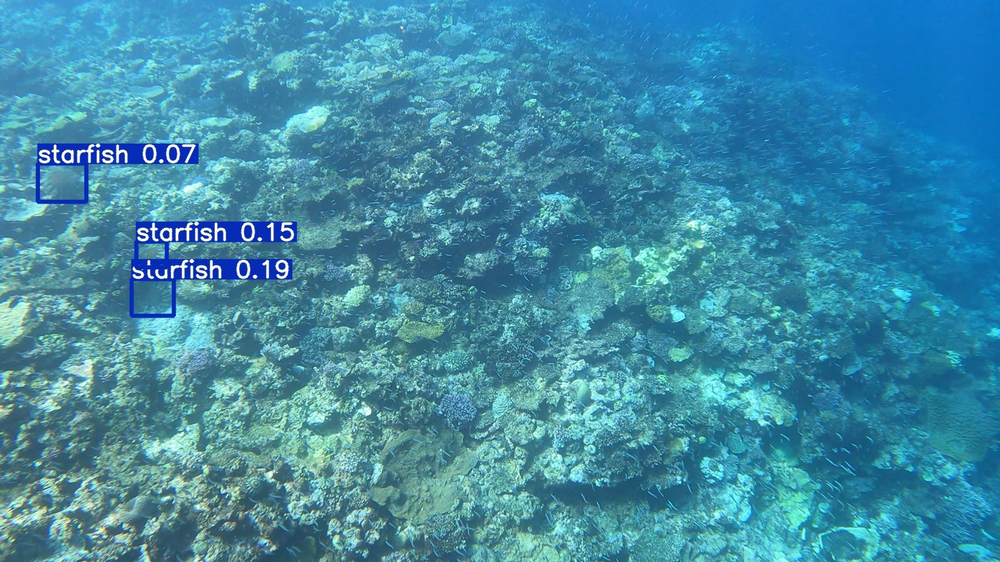

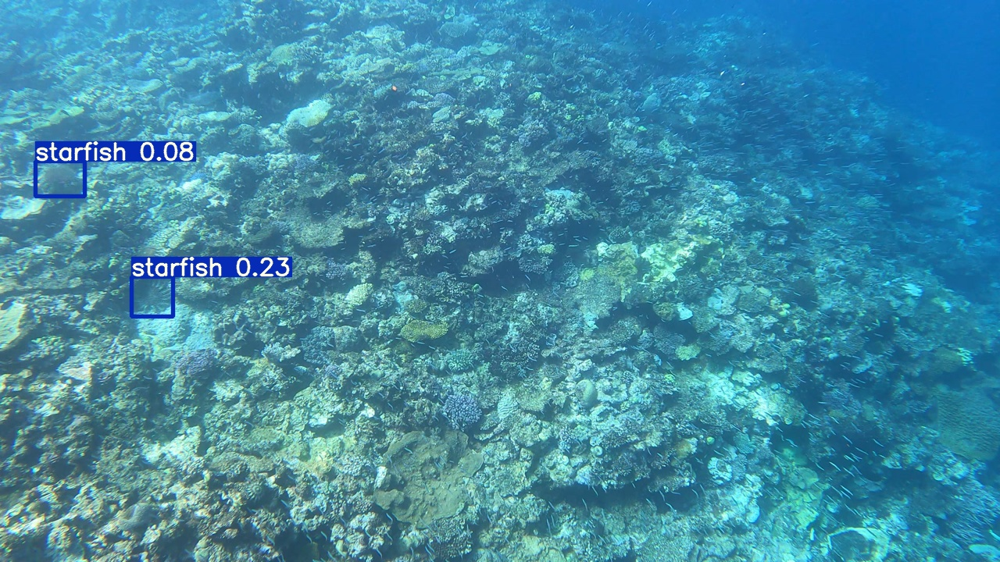

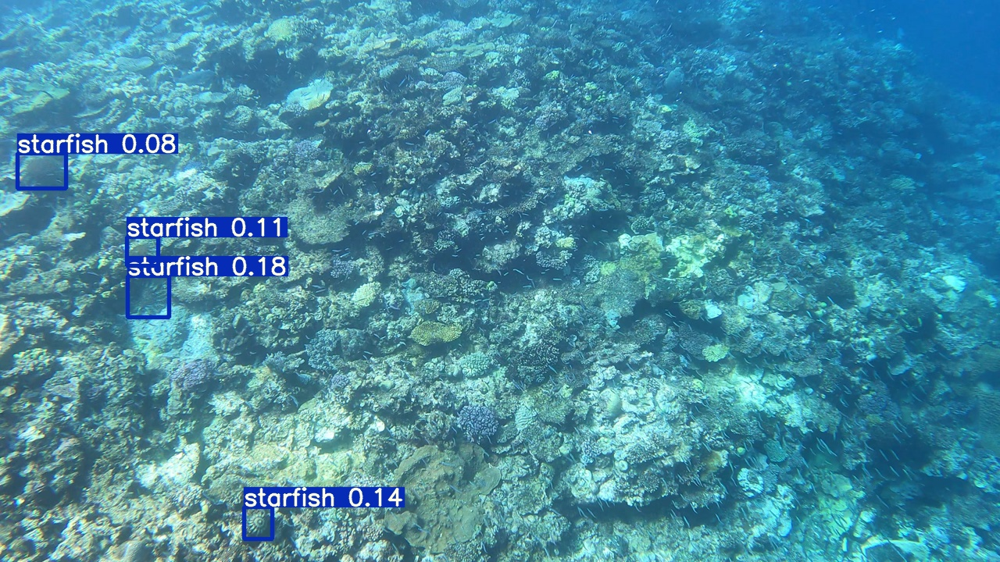

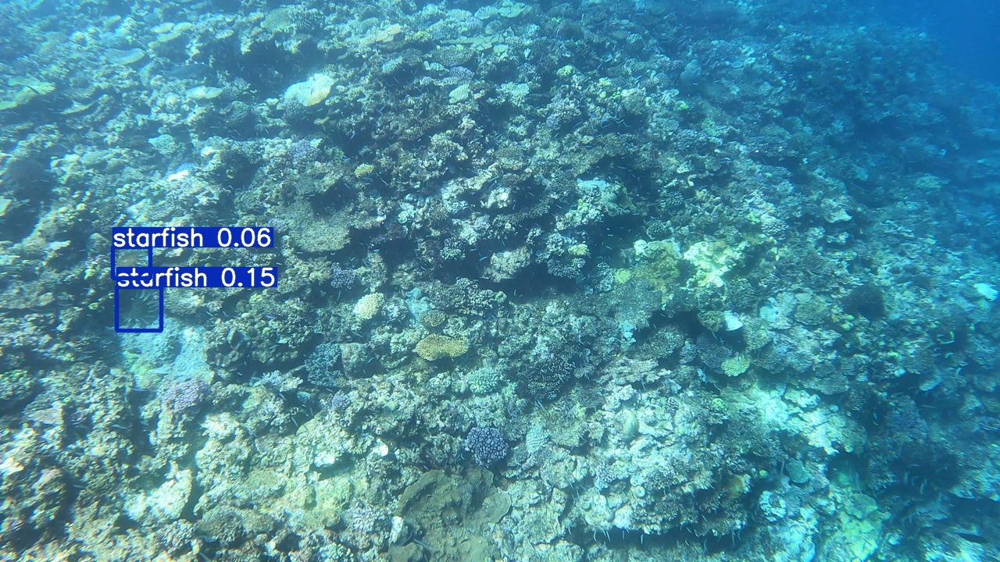

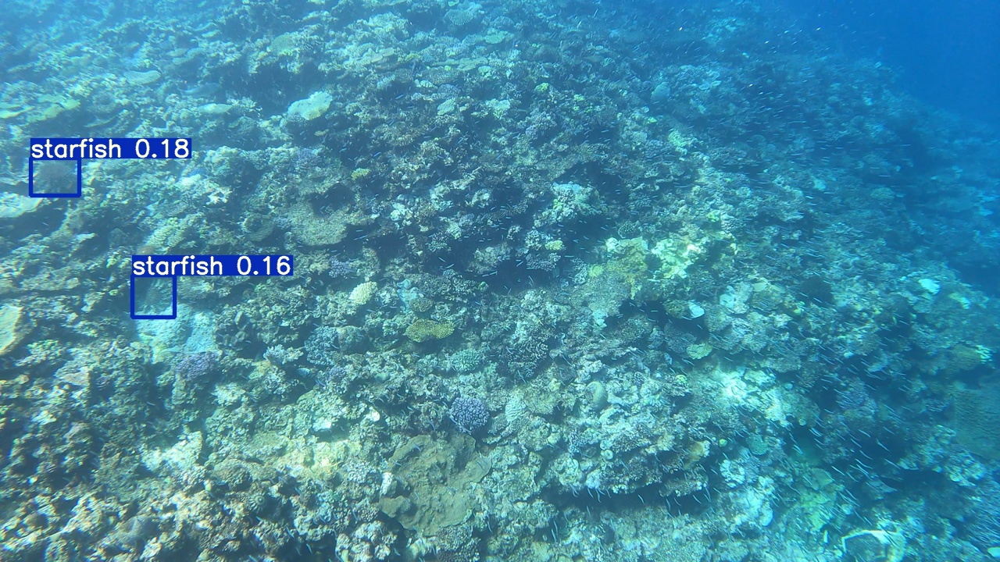

...

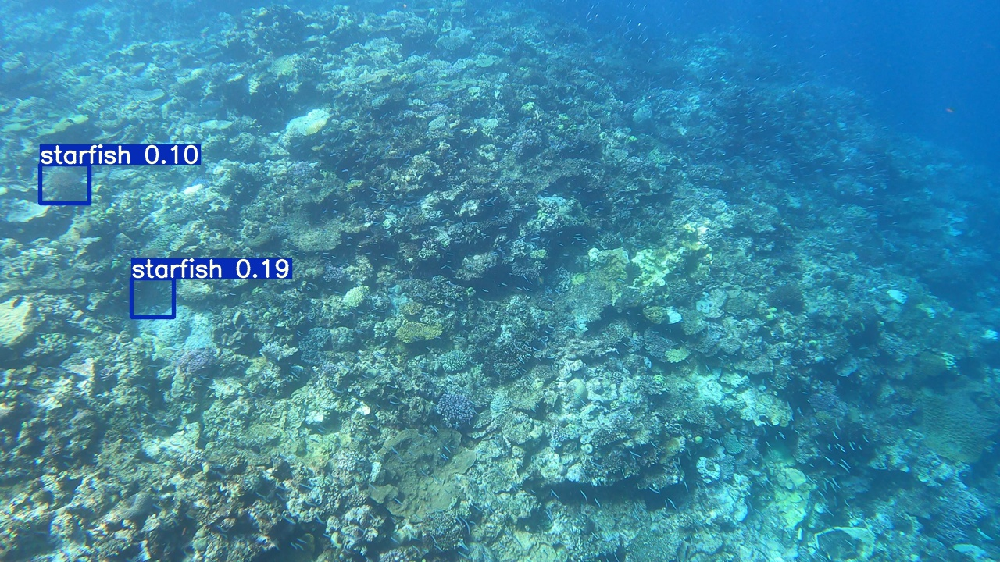

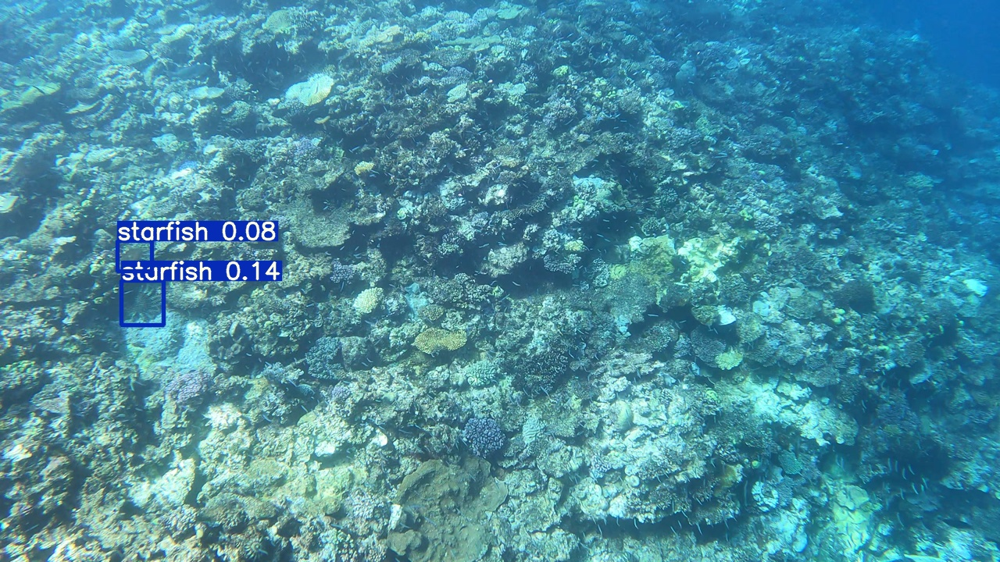

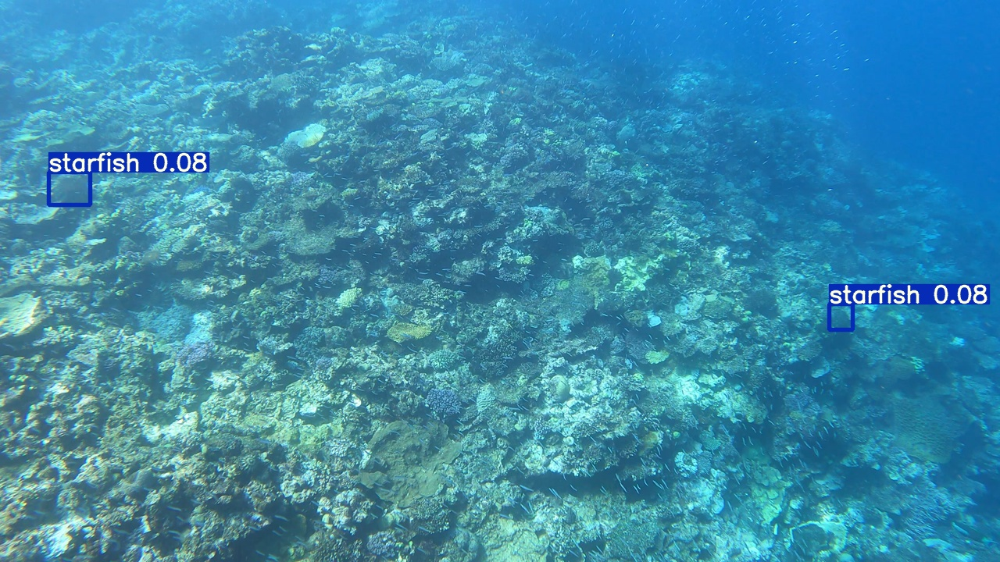

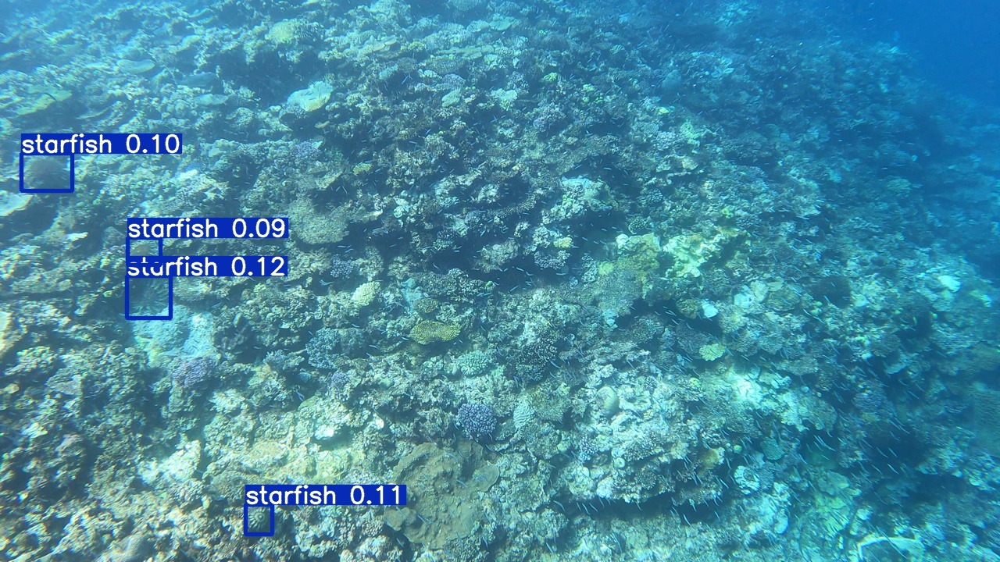

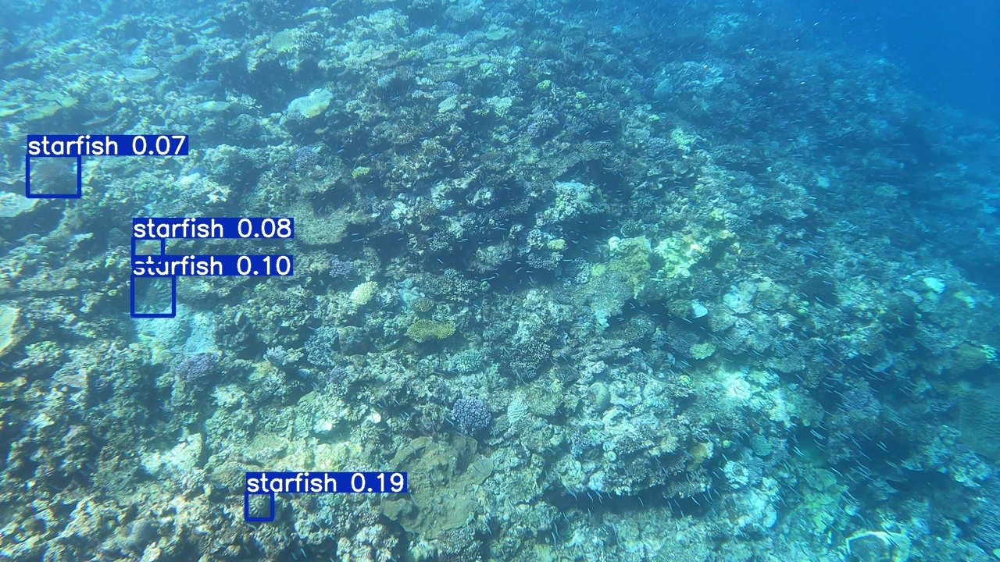

In [69]:
for img in glob.glob('/kaggle/yolor/inference/output/*.jpg'): 
    display(Image(filename=img))
    print("\n")


In [70]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [76]:
!ls /content/gdrive/MyDrive/weights

best_overall.pt


In [75]:
%cp /kaggle/yolor/runs/train/yolor_p6/weights/best_overall.pt /content/gdrive/MyDrive/weights

In [ ]:
from google.colab import files
files.download('/kaggle/yolor/runs/train/yolor_p6/weights/best_overall.pt')